# Análise e Visualização de Dados Financeiros - S&P 500

In [12]:
#@title Importação de bibliotecas essenciais

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import yfinance as yf
import plotly.express as px
import plotly.graph_objects as go
from scipy.cluster.hierarchy import linkage, dendrogram

In [13]:
#@title Obtenção de componentes do S&P 500

table = pd.read_html('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies', header=0)
sp500_table = table[0]
tickers = sp500_table['Symbol'].tolist()
sectors = sp500_table.set_index('Symbol')['GICS Sector'].to_dict()  # dicionário ticker->setor

# Definir intervalo de datas (ex: últimos 10 anos)
start_date = '2015-01-01'
end_date = '2025-01-01'

# Baixar dados históricos (Adj Close e Volume) para todos os tickers
# Usando vários tickers de uma vez para eficiência
data = yf.download(tickers, start=start_date, end=end_date, actions=False, auto_adjust=False)
# 'data' terá MultiIndex nas colunas: nível 0 = ['Adj Close','Volume'], nível 1 = tickers.

# Selecionar apenas Adj Close e Volume para facilitar (opcional, pois já filtramos)
data = data[['Adj Close', 'Volume']]

# Verificar dimensões e amostra dos dados
print(f"Número de dias: {data.shape[0]}, Número de colunas: {data.shape[1]}")
print(data['Adj Close'].head(3))  # primeiras linhas de preços ajustados

[*********************100%***********************]  503 of 503 completed
ERROR:yfinance:
2 Failed downloads:
ERROR:yfinance:['BRK.B']: YFTzMissingError('possibly delisted; no timezone found')
ERROR:yfinance:['BF.B']: YFPricesMissingError('possibly delisted; no price data found  (1d 2015-01-01 -> 2025-01-01)')


Número de dias: 2516, Número de colunas: 1006
Ticker              A       AAPL       ABBV  ABNB        ABT       ACGL  \
Date                                                                      
2015-01-02  37.273815  24.320431  42.761032   NaN  36.744808  18.539352   
2015-01-05  36.575401  23.635284  41.956299   NaN  36.752987  18.428413   
2015-01-06  36.005634  23.637510  41.748634   NaN  36.335632  18.469618   

Ticker            ACN       ADBE        ADI        ADM  ...         WTW  \
Date                                                    ...               
2015-01-02  74.623993  72.339996  44.890640  38.700123  ...  100.578674   
2015-01-05  73.363991  71.980003  44.074310  37.361019  ...   99.856247   
2015-01-06  72.834808  70.529999  43.039726  36.624496  ...   99.359543   

Ticker             WY        WYNN        XEL        XOM        XYL        YUM  \
Date                                                                            
2015-01-02  24.115892  126.880753  26.15

In [14]:
#@title Estatísticas Descritivas por Setor (Preços e Retornos)

# 1) Calcular retornos diários sem usar o método de preenchimento pad por padrão
adj_close = data['Adj Close']  # DataFrame de preços ajustados, MultiIndex: nível 1 = tickers
returns = adj_close.pct_change(fill_method=None).dropna(how='all')  # evitar o warning

stats_list = []
for sector, tickers_in_sector in sp500_table.groupby('GICS Sector')['Symbol']:
    # Seleciona apenas as colunas correspondentes ao setor
    sector_ret = returns[tickers_in_sector.tolist()]
    # Estatísticas diárias
    mean_daily = sector_ret.stack().mean()
    std_daily  = sector_ret.stack().std()
    # Aproximação anual
    mean_annual = (1 + mean_daily) ** 252 - 1
    vol_annual  = std_daily * np.sqrt(252)
    # Acumula no dicionário
    stats_list.append({
        'Setor':             sector,
        'NumAcoes':          len(tickers_in_sector),
        'RetornoMedioDiario': mean_daily,
        'VolDiaria':         std_daily,
        'RetornoMedioAnual': mean_annual,
        'VolAnual':          vol_annual
    })

# 3) Converte a lista em DataFrame e define o índice
sector_stats = pd.DataFrame(stats_list).set_index('Setor')

# 4) Exibe as estatísticas por setor
display(sector_stats.round(4))

,NumAcoes,RetornoMedioDiario,VolDiaria,RetornoMedioAnual,VolAnual
Setor,,,,,
Communication Services,23,0.0006,0.0210,0.1680,0.3340
Consumer Discretionary,51,0.0007,0.0236,0.2008,0.3749
Consumer Staples,38,0.0004,0.0160,0.0946,0.2540
Energy,23,0.0006,0.0268,0.1686,0.4248
Financials,73,0.0007,0.0188,0.1784,0.2991
Health Care,60,0.0006,0.0194,0.1573,0.3086
Industrials,78,0.0007,0.0193,0.1970,0.3062
Information Technology,69,0.0010,0.0237,0.2756,0.3758
Materials,26,0.0005,0.0210,0.1477,0.3330


<ipython-input-16-803c4c9dc791>:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  avg_vol_spy  = float(vol_spy_30.mean())


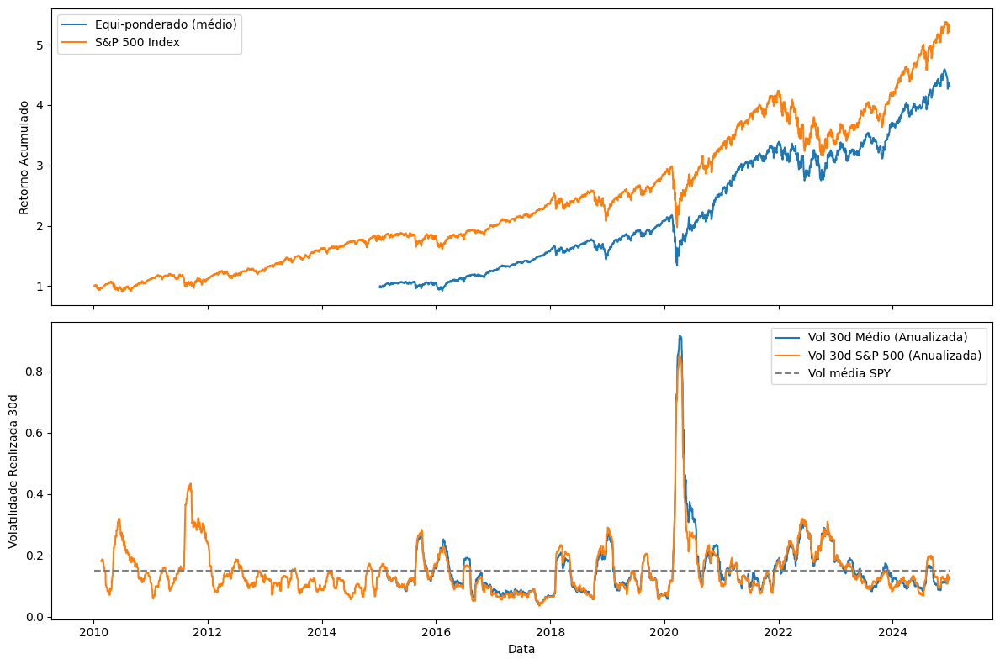

In [16]:
#@title Retorno Acumulado e Volatilidade 30d

START = '2010-01-01'
END   = '2024-12-31'

# médio equi-ponderado do universo
market_ret   = returns.mean(axis=1)
cum_ret_eq   = (1 + market_ret).cumprod()

# pega o índice com auto_adjust=False para ter Adj Close
spy_price    = yf.download(
    '^GSPC',
    start=START,
    end=END,
    auto_adjust=False,    # <— aqui!
    progress=False
)['Adj Close']            # agora existe Adj Close

spy_ret      = spy_price.pct_change(fill_method=None).dropna()
cum_ret_spy  = (1 + spy_ret).cumprod()

vol_eq_30    = market_ret.rolling(30).std() * np.sqrt(252)
vol_spy_30   = spy_ret.rolling(30).std() * np.sqrt(252)
avg_vol_spy  = float(vol_spy_30.mean())

fig, axes = plt.subplots(2,1, figsize=(12,8), sharex=True)
axes[0].plot(cum_ret_eq,  label='Equi-ponderado (médio)')
axes[0].plot(cum_ret_spy, label='S&P 500 Index')
axes[0].set_ylabel('Retorno Acumulado')
axes[0].legend()

axes[1].plot(vol_eq_30,   label='Vol 30d Médio (Anualizada)')
axes[1].plot(vol_spy_30,  label='Vol 30d S&P 500 (Anualizada)')
axes[1].hlines(
    y=avg_vol_spy,
    xmin=vol_spy_30.index.min(),
    xmax=vol_spy_30.index.max(),
    colors='gray',
    linestyles='--',
    label='Vol média SPY'
)
axes[1].set_ylabel('Volatilidade Realizada 30d')
axes[1].set_xlabel('Data')
axes[1].legend()

plt.tight_layout()
plt.show()


,% Missing
Ticker,
BF.B,100.000000
BRK.B,100.000000
SW,95.071542
SOLV,92.408585
GEV,92.408585
VLTO,87.559618
KVUE,83.386328
GEHC,79.610493
CEG,70.508744


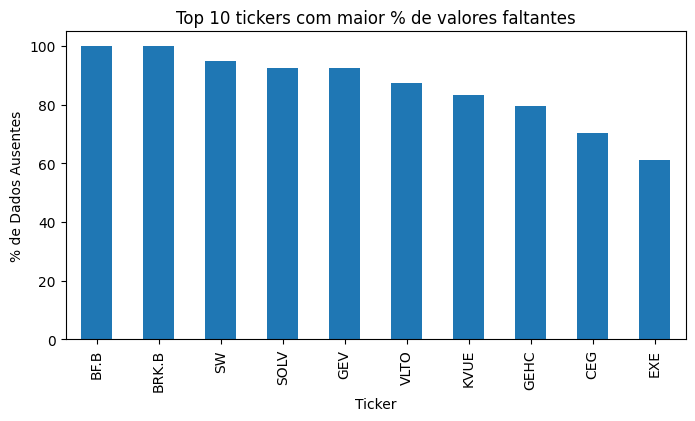

In [15]:
#@title  Cálculo do percentual de valores faltantes e visualização
missing_pct = adj_close.isna().mean() * 100
# Tabela com top-10 tickers mais “faltantes”
top_missing = missing_pct.sort_values(ascending=False).head(10)
display(top_missing.to_frame(name='% Missing'))

# Gráfico dos 10 piores
plt.figure(figsize=(8,4))
top_missing.plot.bar()
plt.ylabel('% de Dados Ausentes')
plt.title('Top 10 tickers com maior % de valores faltantes')
plt.show()

In [17]:
#@title Filtrar tickers com cobertura < 80%
threshold = 20  # em %
bad = missing_pct[missing_pct > threshold].index.tolist()
print(f"Removendo {len(bad)} tickers com >{threshold}% de faltantes:")
print(bad)
# Atualiza prices e returns
prices = adj_close.drop(columns=bad)
returns = returns.drop(columns=bad)
print("Novo shape de preços:", prices.shape)
print("Novo shape de retornos:", returns.shape)

Removendo 26 tickers com >20% de faltantes:
['ABNB', 'BF.B', 'BRK.B', 'CARR', 'CEG', 'CRWD', 'CTVA', 'DASH', 'DAY', 'DOW', 'EXE', 'FOX', 'FOXA', 'GEHC', 'GEV', 'INVH', 'IR', 'KVUE', 'MRNA', 'OTIS', 'PLTR', 'SOLV', 'SW', 'UBER', 'VICI', 'VLTO']
Novo shape de preços: (2516, 477)
Novo shape de retornos: (2515, 477)


In [18]:
#@title Estatísticas descritivas dos preços
desc_prices = prices.describe().round(4)
print("Descritivas dos preços (Close):")
display(desc_prices)

Descritivas dos preços (Close):


Ticker,A,AAPL,ABBV,ABT,ACGL,ACN,ADBE,ADI,ADM,ADP,...,WTW,WY,WYNN,XEL,XOM,XYL,YUM,ZBH,ZBRA,ZTS
count,2516.0000,2516.0000,2516.0000,2516.0000,2516.0000,2516.0000,2516.0000,2516.0000,2516.0000,2516.0000,...,2516.0000,2516.0000,2516.0000,2516.0000,2516.0000,2516.0000,2516.0000,2516.0000,2516.0000,2516.0000
mean,89.2552,94.1799,88.2548,76.1199,41.4487,200.6287,319.9754,114.8014,47.4908,150.3886,...,176.5128,25.9319,100.1845,47.7982,66.6065,76.9587,89.9051,115.5115,233.4021,116.7038
std,40.0986,65.6651,43.5118,30.2207,22.2622,91.1414,176.2018,53.4132,17.0333,64.5579,...,55.0848,4.9099,26.9015,13.4799,23.5419,30.6868,29.6614,16.1006,140.2149,55.7531
min,30.9083,20.6745,32.3551,30.5621,18.3745,70.5837,69.9900,40.5633,23.2646,59.5325,...,93.2767,11.2315,42.1053,23.5613,24.8094,26.9590,39.7449,75.1258,46.9300,36.6900
25%,56.4107,35.3434,50.4632,42.3404,26.4627,111.8932,143.6125,70.0003,34.5305,87.9340,...,129.6815,21.9840,82.8167,35.3750,53.5704,49.9940,63.8720,104.9388,105.9150,58.6853
50%,76.5232,64.6082,72.0000,77.4916,31.6871,178.4363,303.9350,102.4000,38.6572,141.4363,...,180.7467,25.6734,95.8486,52.0482,57.7489,73.5849,89.7751,112.8209,217.0000,120.9363
75%,129.3004,150.7477,128.6573,103.8230,44.5163,285.5599,479.4700,158.5725,59.4324,208.4380,...,219.5832,29.7884,116.5451,59.4160,82.5003,101.1193,117.2086,124.4948,307.0175,167.1353
max,174.7845,258.7355,200.1160,132.4166,109.2202,393.4059,688.3700,240.3092,91.1162,304.7586,...,330.6910,38.0830,186.3089,71.7205,123.2458,144.3303,140.4350,167.9991,614.5500,239.0987


In [19]:
#@title Estatísticas descritivas dos retornos
desc_returns = returns.describe().round(4)
print("Descritivas dos retornos (pct_change):")
display(desc_returns)

Descritivas dos retornos (pct_change):


Ticker,A,AAPL,ABBV,ABT,ACGL,ACN,ADBE,ADI,ADM,ADP,...,WTW,WY,WYNN,XEL,XOM,XYL,YUM,ZBH,ZBRA,ZTS
count,2515.0000,2515.0000,2515.0000,2515.0000,2515.0000,2515.0000,2515.0000,2515.0000,2515.0000,2515.0000,...,2515.0000,2515.0000,2515.0000,2515.0000,2515.0000,2515.0000,2515.0000,2515.0000,2515.0000,2515.0000
mean,0.0006,0.0011,0.0007,0.0006,0.0008,0.0007,0.0009,0.0008,0.0002,0.0007,...,0.0006,0.0003,0.0003,0.0005,0.0004,0.0006,0.0006,0.0002,0.0010,0.0007
std,0.0167,0.0179,0.0168,0.0149,0.0168,0.0157,0.0209,0.0198,0.0168,0.0150,...,0.0149,0.0200,0.0311,0.0135,0.0175,0.0168,0.0150,0.0171,0.0248,0.0164
min,-0.1101,-0.1286,-0.1625,-0.0979,-0.1688,-0.0931,-0.1679,-0.1661,-0.2420,-0.1525,...,-0.0922,-0.2267,-0.2443,-0.1269,-0.1222,-0.1203,-0.1883,-0.1399,-0.2385,-0.1470
25%,-0.0078,-0.0073,-0.0069,-0.0065,-0.0063,-0.0065,-0.0078,-0.0092,-0.0073,-0.0056,...,-0.0060,-0.0089,-0.0144,-0.0061,-0.0083,-0.0073,-0.0059,-0.0076,-0.0109,-0.0072
50%,0.0011,0.0010,0.0012,0.0006,0.0011,0.0012,0.0014,0.0010,0.0009,0.0010,...,0.0007,0.0006,-0.0004,0.0007,0.0002,0.0006,0.0007,0.0000,0.0011,0.0008
75%,0.0098,0.0101,0.0086,0.0084,0.0083,0.0084,0.0111,0.0110,0.0090,0.0081,...,0.0074,0.0096,0.0140,0.0077,0.0089,0.0092,0.0073,0.0082,0.0127,0.0090
max,0.0984,0.1198,0.1377,0.1094,0.1536,0.1286,0.1772,0.1470,0.1027,0.1180,...,0.1511,0.2532,0.2769,0.1126,0.1269,0.1126,0.2325,0.1558,0.1721,0.1198


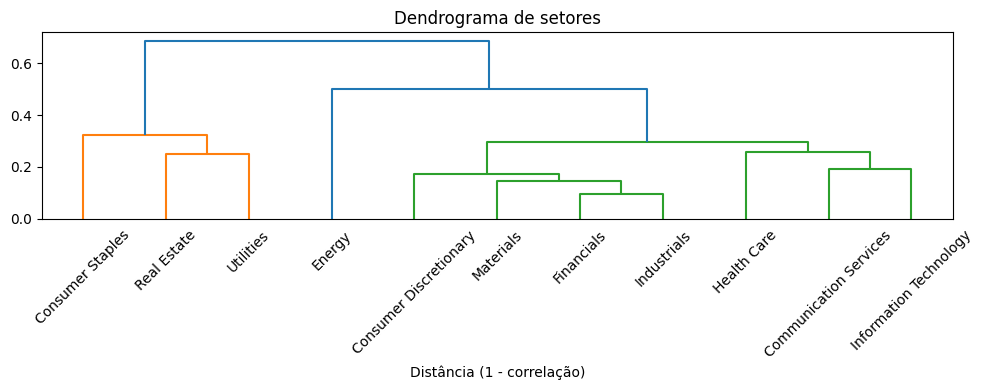

In [ ]:
#@title Dendrograma de Setores

plt.figure(figsize=(10, 4))
dend = dendrogram(
    Z,
    labels=labels,
    leaf_rotation=45,     # gira 45°
    leaf_font_size=10
)
plt.title("Dendrograma de setores")
plt.xlabel("Distância (1 - correlação)")
plt.ylabel("")
plt.tight_layout()
plt.show()


S&P 500 – Drawdown máximo: -33.9%
  Pico antes da queda: 2020-02-19
  Fundo do drawdown:   2020-03-23
  Recuperado em:       2020-08-18


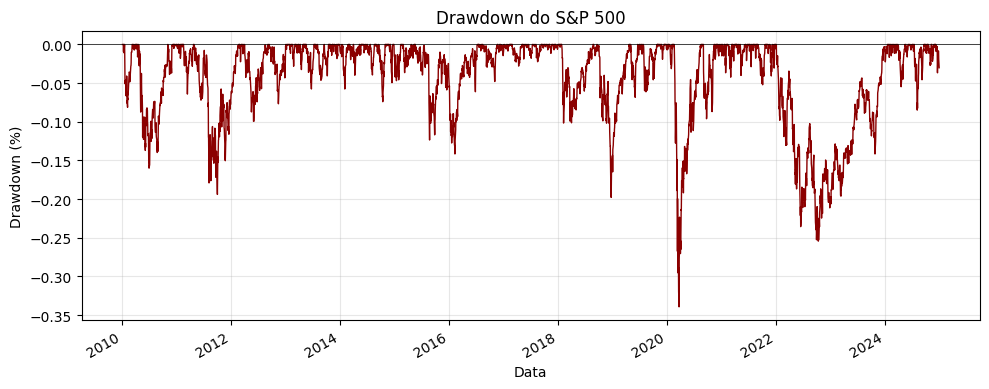

In [24]:
#@title Drawdown do S&P 500

# 1) Baixar o índice e extrair SÉRIE de preços ajustados
START, END = '2010-01-01', '2024-12-31'
spy_raw   = yf.download('^GSPC',
                        start=START,
                        end=END,
                        auto_adjust=False,
                        progress=False)

# 'spy_raw["Adj Close"]' pode ser DataFrame com 1 coluna; vamos garantir Series:
adj = spy_raw['Adj Close']
# squeeze() : se for DataFrame de 1 coluna vira Series; se já for Series, permanece.
spy_price = adj.squeeze()

# Confirmação (deve ser pandas.Series)
assert isinstance(spy_price, pd.Series)
assert isinstance(spy_price.index, pd.DatetimeIndex)

# 2) Calcula retorno diário e cumulativo
spy_ret = spy_price.pct_change(fill_method=None).dropna()
spy_cum = (1 + spy_ret).cumprod()

# 3) Função de drawdown que recebe Series com DatetimeIndex
def compute_drawdown_info(series: pd.Series):
    peak = series.cummax()
    dd   = series / peak - 1.0

    max_dd    = dd.min()
    valley_dt = dd.idxmin()                  # Timestamp do fundo
    peak_dt   = series[:valley_dt].idxmax()  # Timestamp do pico anterior

    # data de recuperação (primeiro dia em que série >= pico anterior)
    after      = series[valley_dt:]
    recovered  = after[after >= peak.loc[valley_dt]].index
    recov_dt   = recovered[0] if len(recovered) else None

    return float(max_dd), peak_dt, valley_dt, recov_dt

# 4) Executar e imprimir
md, peak_dt, valley_dt, recov_dt = compute_drawdown_info(spy_cum)
print(f"S&P 500 – Drawdown máximo: {md*100:.1f}%")
print(f"  Pico antes da queda: {peak_dt.date()}")
print(f"  Fundo do drawdown:   {valley_dt.date()}")
print(f"  Recuperado em:       {recov_dt.date() if recov_dt else 'N/A'}")

# 5) Plot do drawdown
drawdown = spy_cum / spy_cum.cummax() - 1.0
plt.figure(figsize=(10,4))
drawdown.plot(color='darkred', linewidth=1)
plt.title('Drawdown do S&P 500')
plt.ylabel('Drawdown (%)')
plt.xlabel('Data')
plt.axhline(0, color='black', linewidth=0.5)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


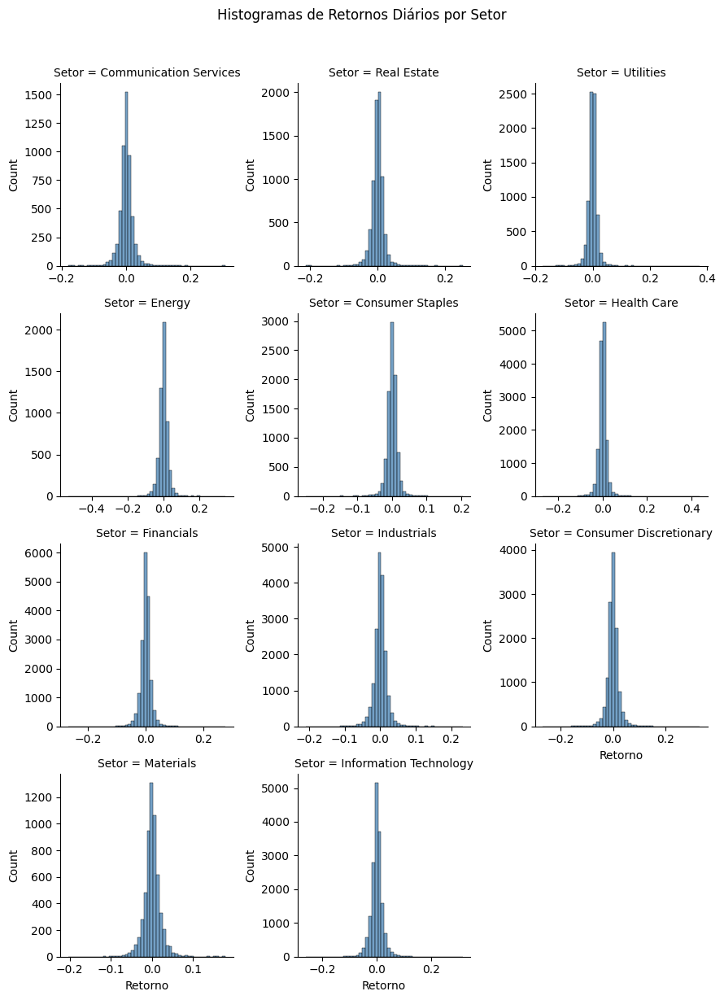

In [ ]:
#@title Histogramas de Retornos Diários por Setor (FacetGrid)

# Usar a mesma amostra ret_sample de 10%
g = sns.FacetGrid(
    ret_sample,
    col='Setor',
    col_wrap=3,
    sharex=False,
    sharey=False,
    height=3
)
g.map(sns.histplot, 'Retorno', bins=50, color='steelblue')
g.fig.suptitle('Histogramas de Retornos Diários por Setor', y=1.02)
plt.tight_layout()
plt.show()


In [29]:
#@title Estatísticas de Retorno Médio por Dia da Semana

market_equal_weight_ret = returns.mean(axis=1)

# Preparar DataFrame com retorno médio diário do mercado
market_df = pd.DataFrame({'Retorno': market_equal_weight_ret})

# Adicionar coluna Weekday (0=Segunda, ..., 4=Sexta)
market_df['Weekday'] = market_df.index.dayofweek

# Calcular estatísticas por weekday
weekday_stats = market_df.groupby('Weekday')['Retorno'].agg(['mean','std','count'])
weekday_stats['mean_pct'] = weekday_stats['mean'] * 100

# Mostrar tabela
weekday_stats[['mean_pct']].rename(columns={'mean_pct':'Retorno Médio (%)'})


,Retorno Médio (%)
Weekday,
0,0.038512
1,0.064734
2,0.060929
3,0.056475
4,0.098599


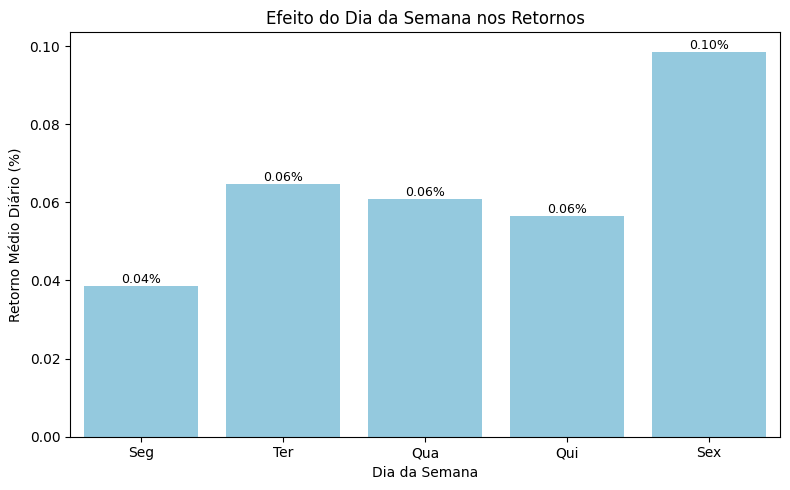

In [30]:
#@title Gráfico de Retorno Médio Diário por Dia da Semana (corrigido)

# Definimos uma cor fixa em vez de usar `palette` sem `hue`
bar_color = 'skyblue'

plt.figure(figsize=(8,5))
ax = sns.barplot(
    x=weekday_stats.index,
    y=weekday_stats['mean_pct'],
    color=bar_color
)

# Garante que haja exatamente 5 ticks, um para cada dia
ax.set_xticks(range(len(weekday_stats.index)))
ax.set_xticklabels(['Seg','Ter','Qua','Qui','Sex'])

ax.set_xlabel('Dia da Semana')
ax.set_ylabel('Retorno Médio Diário (%)')
ax.set_title('Efeito do Dia da Semana nos Retornos')

# Anotações de valor em cima de cada barra
for p in ax.patches:
    height = p.get_height()
    ax.annotate(
        f'{height:.2f}%',
        (p.get_x() + p.get_width()/2, height),
        ha='center',
        va='bottom',
        fontsize=9
    )

plt.tight_layout()
plt.show()


In [31]:
#@title Estatísticas de Retorno Médio por Mês do Ano

# Adicionar coluna Month (1=Jan, ..., 12=Dez)
market_df['Month'] = market_df.index.month

# Calcular estatísticas por mês
month_stats = market_df.groupby('Month')['Retorno'].agg(['mean','std','count'])
month_stats['mean_pct'] = month_stats['mean'] * 100

# Mostrar tabela
month_stats[['mean_pct']].rename(columns={'mean_pct':'Retorno Médio (%)'})


,Retorno Médio (%)
Month,
1,0.056391
2,0.052905
3,0.049022
4,0.076783
5,0.064397
6,0.047206
7,0.175829
8,0.009283
9,-0.068693


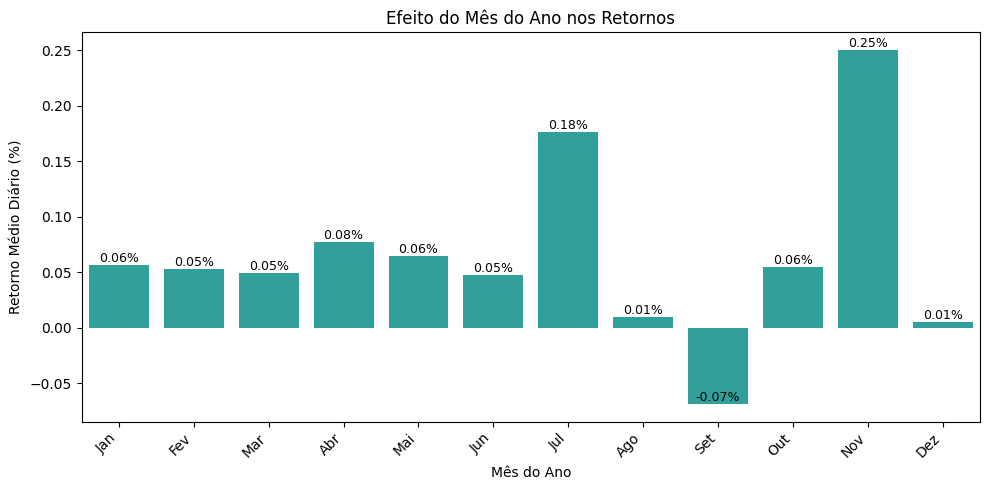

In [32]:
#@title Gráfico de Retorno Médio Diário por Mês do Ano

# Usar color único em vez de palette sem hue
bar_color = 'lightseagreen'

plt.figure(figsize=(10,5))
ax = sns.barplot(
    x=month_stats.index,
    y=month_stats['mean_pct'],
    color=bar_color
)

# Definir exatamente 12 ticks antes de rotular
ax.set_xticks(range(len(month_stats.index)))
ax.set_xticklabels(
    ['Jan','Fev','Mar','Abr','Mai','Jun','Jul','Ago','Set','Out','Nov','Dez'],
    rotation=45,
    ha='right'
)

ax.set_xlabel('Mês do Ano')
ax.set_ylabel('Retorno Médio Diário (%)')
ax.set_title('Efeito do Mês do Ano nos Retornos')

# Anotações acima de cada barra
for p in ax.patches:
    height = p.get_height()
    ax.annotate(
        f'{height:.2f}%',
        (p.get_x() + p.get_width()/2, height),
        ha='center',
        va='bottom',
        fontsize=9
    )

plt.tight_layout()
plt.show()


In [ ]:
#@title Gráfico de preço normalizado de todas ações de um setor

sector_to_plot = 'Information Technology'
sector_tickers = sp500_table[sp500_table['GICS Sector']==sector_to_plot]['Symbol'].tolist()
prices_sector = adj_close[sector_tickers]
# Normalizar preços ao nível 100 no início
prices_sector_norm = prices_sector.divide(prices_sector.iloc[0]) * 100

fig = px.line(prices_sector_norm, x=prices_sector_norm.index, y=sector_tickers,
              title=f'Preços normalizados - Setor {sector_to_plot}')
fig.update_layout(legend_title_text='Ticker')
fig.show()


In [ ]:
#@title Dropdown para selecionar um ticker e mostrar preço vs volume
tickers_options = [{'label': tic, 'value': tic} for tic in tickers[:50]]  # limitar a 50 primeiros por exemplo
# Preparar figura com dois eixos (preço e volume)
fig2 = go.Figure()
# Traços iniciais (um ticker default, ex: primeiro da lista)
default_ticker = tickers[0]
fig2.add_trace(go.Scatter(x=adj_close.index, y=adj_close[default_ticker],
                          name='Preço Ajustado', yaxis='y1'))
fig2.add_trace(go.Bar(x=adj_close.index, y=data['Volume'][default_ticker],
                      name='Volume', yaxis='y2', opacity=0.3))
# Configurar eixos duplos
fig2.update_layout(
    title="Preço e Volume - seletor de Ticker",
    yaxis=dict(title="Adj Close", side='left'),
    yaxis2=dict(title="Volume", overlaying='y', side='right', type='linear', rangemode='tozero')
)
# Adicionar dropdown de seleção de ticker
fig2.update_layout(
    updatemenus=[{
        'buttons': [
            {
                'method': 'update',
                'label': tic,
                'args': [
                    {'y': [adj_close[tic], data['Volume'][tic]]},  # atualiza dados dos traços
                    {'title': f'Preço e Volume - {tic}'}
                ]
            } for tic in tickers[:50]
        ],
        'direction': 'down',
        'showactive': True,
        'x': 0.0,
        'y': 1.15
    }]
)
fig2.show()